In [1]:
# !pip install pandas-profiling

In [3]:
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
from pandas_profiling import ProfileReport
import math

Synthetic Minority Oversampling Technique (SMOTE) is a statistical technique for increasing the number of cases in your dataset in a balanced way. The component works by generating new instances from existing minority cases that you supply as input.

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant 
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.datasets import make_classification
from sklearn.feature_selection import f_classif
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE

In [5]:
# !pip install mlxtend

In [6]:
from sklearn.metrics import confusion_matrix,plot_roc_curve, classification_report
from sklearn.metrics import mean_absolute_error , mean_absolute_percentage_error , mean_squared_error , accuracy_score
from mlxtend.plotting import plot_confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
%matplotlib inline

In [ ]:

import warnings
warnings.filterwarnings("ignore")

# Data Exploring

In [8]:
data = pd.read_csv("diabetes_3.csv" , sep = "," , encoding = 'utf-8')

In [8]:
profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
Orginal_data = pd.read_csv("diabetes_4.csv" , sep = "," , encoding = 'utf-8')

In [10]:
profile = ProfileReport(Orginal_data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [11]:
data.shape

(253680, 22)

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_binary       253680 non-null  float64
 1   HighBP                253680 non-null  float64
 2   HighChol              253680 non-null  float64
 3   CholCheck             253680 non-null  float64
 4   BMI                   253680 non-null  float64
 5   Smoker                253680 non-null  float64
 6   Stroke                253680 non-null  float64
 7   HeartDiseaseorAttack  253680 non-null  float64
 8   PhysActivity          253680 non-null  float64
 9   Fruits                253680 non-null  float64
 10  Veggies               253680 non-null  float64
 11  HvyAlcoholConsump     253680 non-null  float64
 12  AnyHealthcare         253680 non-null  float64
 13  NoDocbcCost           253680 non-null  float64
 14  GenHlth               253680 non-null  float64
 15  

In [13]:
data.head()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,1.0,1.0,1.0,40.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,5.0,18.0,15.0,1.0,0.0,9.0,4.0,3.0
1,0.0,0.0,0.0,0.0,25.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,3.0,0.0,0.0,0.0,0.0,7.0,6.0,1.0
2,0.0,1.0,1.0,1.0,28.0,0.0,0.0,0.0,0.0,1.0,...,1.0,1.0,5.0,30.0,30.0,1.0,0.0,9.0,4.0,8.0
3,0.0,1.0,0.0,1.0,27.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,0.0,0.0,0.0,0.0,11.0,3.0,6.0
4,0.0,1.0,1.0,1.0,24.0,0.0,0.0,0.0,1.0,1.0,...,1.0,0.0,2.0,3.0,0.0,0.0,0.0,11.0,5.0,4.0


In [14]:
data.describe()

,Diabetes_binary,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
count,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,...,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000,253680.000000
mean,0.139333,0.429001,0.424121,0.962670,28.382364,0.443169,0.040571,0.094186,0.756544,0.634256,...,0.951053,0.084177,2.511392,3.184772,4.242081,0.168224,0.440342,8.032119,5.050434,6.053875
std,0.346294,0.494934,0.494210,0.189571,6.608694,0.496761,0.197294,0.292087,0.429169,0.481639,...,0.215759,0.277654,1.068477,7.412847,8.717951,0.374066,0.496429,3.054220,0.985774,2.071148
min,0.000000,0.000000,0.000000,0.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,1.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,6.000000,4.000000,5.000000
50%,0.000000,0.000000,0.000000,1.000000,27.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,8.000000,5.000000,7.000000
75%,0.000000,1.000000,1.000000,1.000000,31.000000,1.000000,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,3.000000,2.000000,3.000000,0.000000,1.000000,10.000000,6.000000,8.000000
max,1.000000,1.000000,1.000000,1.000000,98.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,5.000000,30.000000,30.000000,1.000000,1.000000,13.000000,6.000000,8.000000


# Preprocessing

In [15]:
# Transform the data into integer
data["Diabetes_binary"] = data["Diabetes_binary"].astype(int)
data["HighBP"] = data["HighBP"].astype(int)
data["HighChol"] = data["HighChol"].astype(int)
data["CholCheck"] = data["CholCheck"].astype(int)
data["BMI"] = data["BMI"].astype(int)
data["Smoker"] = data["Smoker"].astype(int)
data["Stroke"] = data["Stroke"].astype(int)
data["HeartDiseaseorAttack"] = data["HeartDiseaseorAttack"].astype(int)
data["PhysActivity"] = data["PhysActivity"].astype(int)
data["Fruits"] = data["Fruits"].astype(int) 
data["Veggies"] = data["Veggies"].astype(int)
data["HvyAlcoholConsump"] = data["HvyAlcoholConsump"].astype(int)
data["AnyHealthcare"] = data["AnyHealthcare"].astype(int)
data["NoDocbcCost"] = data["NoDocbcCost"].astype(int)
data["GenHlth"] = data["GenHlth"].astype(int)
data["MentHlth"] = data["MentHlth"].astype(int)
data["PhysHlth"] = data["PhysHlth"].astype(int)
data["DiffWalk"] = data["DiffWalk"].astype(int)
data["Sex"] = data["Sex"].astype(int)
data["Age"] = data["Age"].astype(int)
data["Education"] = data["Education"].astype(int)
data["Income"] =data["Income"].astype(int)

In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype
---  ------                --------------   -----
 0   Diabetes_binary       253680 non-null  int32
 1   HighBP                253680 non-null  int32
 2   HighChol              253680 non-null  int32
 3   CholCheck             253680 non-null  int32
 4   BMI                   253680 non-null  int32
 5   Smoker                253680 non-null  int32
 6   Stroke                253680 non-null  int32
 7   HeartDiseaseorAttack  253680 non-null  int32
 8   PhysActivity          253680 non-null  int32
 9   Fruits                253680 non-null  int32
 10  Veggies               253680 non-null  int32
 11  HvyAlcoholConsump     253680 non-null  int32
 12  AnyHealthcare         253680 non-null  int32
 13  NoDocbcCost           253680 non-null  int32
 14  GenHlth               253680 non-null  int32
 15  MentHlth              253680 non-n

In [17]:
data.isnull().sum()

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

In [18]:
# Checking unique values in different variables
unique_values = {}
for col in data.columns:
    unique_values[col] = data[col].value_counts().shape[0]

pd.DataFrame(unique_values, index=['unique value count']).transpose()

,unique value count
Diabetes_binary,2
HighBP,2
HighChol,2
CholCheck,2
BMI,84
Smoker,2
Stroke,2
HeartDiseaseorAttack,2
PhysActivity,2
Fruits,2


In [19]:
def v_counts(dataframe):
    for i in dataframe :
        print(dataframe[i].value_counts())
        print("_____________________________________________________________________________")

In [20]:
v_counts(data)

0    218334
1     35346
Name: Diabetes_binary, dtype: int64
_____________________________________________________________________________
0    144851
1    108829
Name: HighBP, dtype: int64
_____________________________________________________________________________
0    146089
1    107591
Name: HighChol, dtype: int64
_____________________________________________________________________________
1    244210
0      9470
Name: CholCheck, dtype: int64
_____________________________________________________________________________
27    24606
26    20562
24    19550
25    17146
28    16545
      ...  
78        1
85        1
86        1
90        1
91        1
Name: BMI, Length: 84, dtype: int64
_____________________________________________________________________________
0    141257
1    112423
Name: Smoker, dtype: int64
_____________________________________________________________________________
0    243388
1     10292
Name: Stroke, dtype: int64
____________________________________________

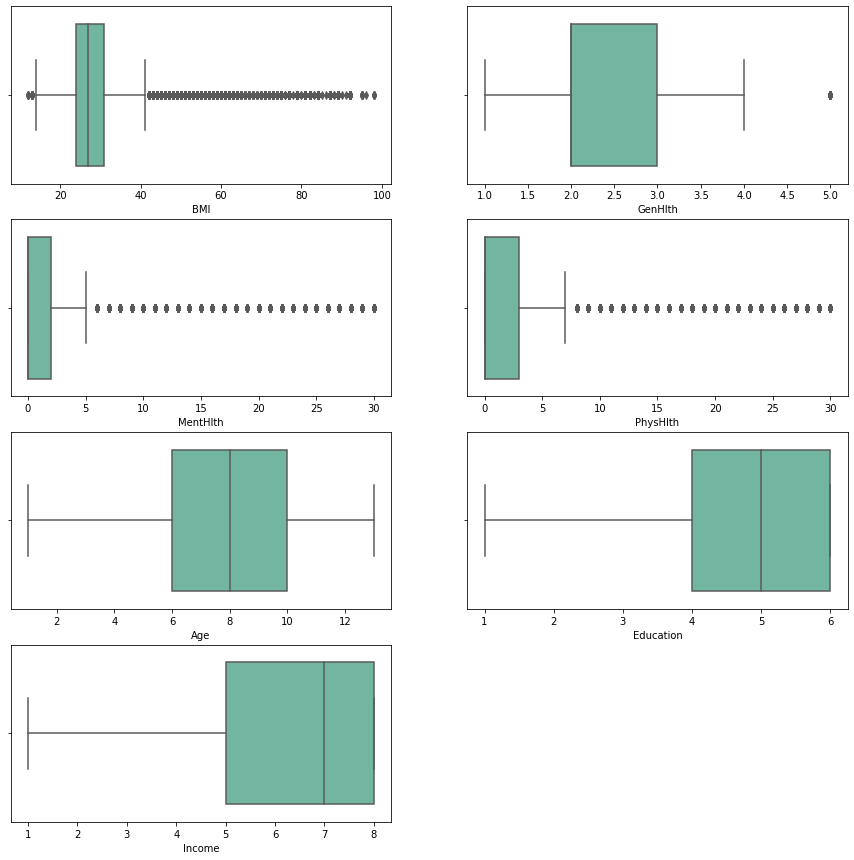

In [21]:
# Checking the Outliers
plt.figure(figsize = (15,15))
for i,col in enumerate(['BMI', 'GenHlth', 'MentHlth', 'PhysHlth', 'Age','Education', 'Income']):
    plt.subplot(4,2,i+1)
    sns.boxplot(x = col, data = data ,palette='Set2')
plt.show()

In [22]:
# Checking and droping the duplicate data
data.duplicated().sum()

24206

In [23]:
data.drop_duplicates(inplace = True)

In [24]:
data.duplicated().sum()

0

In [25]:
data.shape

(229474, 22)

some codes that help us in EDA

In [26]:
#Replacing 0 into Non-Diabetic and 1 into Diabetic 
#adding new column Diabetes_binary_str  

data["Diabetes_binary_str"]= data["Diabetes_binary"].replace({0:"Non-Diabetic",1:"Diabetic"})

In [27]:
#help us to show the categorical variable 
data2 = data.copy() 

In [28]:
# That help us to show the relation between features clearly

data2.Age[data2['Age'] == 1] = '18 to 24'
data2.Age[data2['Age'] == 2] = '25 to 29'
data2.Age[data2['Age'] == 3] = '30 to 34'
data2.Age[data2['Age'] == 4] = '35 to 39'
data2.Age[data2['Age'] == 5] = '40 to 44'
data2.Age[data2['Age'] == 6] = '45 to 49'
data2.Age[data2['Age'] == 7] = '50 to 54'
data2.Age[data2['Age'] == 8] = '55 to 59'
data2.Age[data2['Age'] == 9] = '60 to 64'
data2.Age[data2['Age'] == 10] = '65 to 69'
data2.Age[data2['Age'] == 11] = '70 to 74'
data2.Age[data2['Age'] == 12] = '75 to 79'
data2.Age[data2['Age'] == 13] = '80 or older'
data2.Diabetes_binary[data2['Diabetes_binary'] == 0] = 'No Diabetes'
data2.Diabetes_binary[data2['Diabetes_binary'] == 1] = 'Diabetes'

data2.HighBP[data2['HighBP'] == 0] = 'No High'
data2.HighBP[data2['HighBP'] == 1] = 'High BP'

data2.HighChol[data2['HighChol'] == 0] = 'No High Cholesterol'
data2.HighChol[data2['HighChol'] == 1] = 'High Cholesterol'

data2.CholCheck[data2['CholCheck'] == 0] = 'No Cholesterol Check in 5 Years'
data2.CholCheck[data2['CholCheck'] == 1] = 'Cholesterol Check in 5 Years'
data2.Smoker[data2['Smoker'] == 0] = 'No'
data2.Smoker[data2['Smoker'] == 1] = 'Yes'

data2.Stroke[data2['Stroke'] == 0] = 'No'
data2.Stroke[data2['Stroke'] == 1] = 'Yes'

data2.HeartDiseaseorAttack[data2['HeartDiseaseorAttack'] == 0] = 'No'
data2.HeartDiseaseorAttack[data2['HeartDiseaseorAttack'] == 1] = 'Yes'

data2.PhysActivity[data2['PhysActivity'] == 0] = 'No'
data2.PhysActivity[data2['PhysActivity'] == 1] = 'Yes'

data2.Fruits[data2['Fruits'] == 0] = 'No'
data2.Fruits[data2['Fruits'] == 1] = 'Yes'
data2.Veggies[data2['Veggies'] == 0] = 'No'
data2.Veggies[data2['Veggies'] == 1] = 'Yes'

data2.HvyAlcoholConsump[data2['HvyAlcoholConsump'] == 0] = 'No'
data2.HvyAlcoholConsump[data2['HvyAlcoholConsump'] == 1] = 'Yes'

data2.AnyHealthcare[data2['AnyHealthcare'] == 0] = 'No'
data2.AnyHealthcare[data2['AnyHealthcare'] == 1] = 'Yes'

data2.NoDocbcCost[data2['NoDocbcCost'] == 0] = 'No'
data2.NoDocbcCost[data2['NoDocbcCost'] == 1] = 'Yes'

data2.GenHlth[data2['GenHlth'] == 5] = 'Excellent'
data2.GenHlth[data2['GenHlth'] == 4] = 'Very Good'
data2.GenHlth[data2['GenHlth'] == 3] = 'Good'
data2.GenHlth[data2['GenHlth'] == 2] = 'Fair'
data2.GenHlth[data2['GenHlth'] == 1] = 'Poor'

data2.DiffWalk[data2['DiffWalk'] == 0] = 'No'
data2.DiffWalk[data2['DiffWalk'] == 1] = 'Yes'

data2.Sex[data2['Sex'] == 0] = 'Female'
data2.Sex[data2['Sex'] == 1] = 'Male'

data2.Education[data2['Education'] == 1] = 'Never Attended School'
data2.Education[data2['Education'] == 2] = 'Elementary'
data2.Education[data2['Education'] == 3] = 'Junior High School'
data2.Education[data2['Education'] == 4] = 'Senior High School'
data2.Education[data2['Education'] == 5] = 'Undergraduate Degree'
data2.Education[data2['Education'] == 6] = 'Magister'

data2.Income[data2['Income'] == 1] = 'Less Than $10,000'
data2.Income[data2['Income'] == 2] = 'Less Than $10,000'
data2.Income[data2['Income'] == 3] = 'Less Than $10,000'
data2.Income[data2['Income'] == 4] = 'Less Than $10,000'
data2.Income[data2['Income'] == 5] = 'Less Than $35,000'
data2.Income[data2['Income'] == 6] = 'Less Than $35,000'
data2.Income[data2['Income'] == 7] = 'Less Than $35,000'
data2.Income[data2['Income'] == 8] = '$75,000 or More'



# EDA

Text(0.5, 1.0, 'correlation of feature')

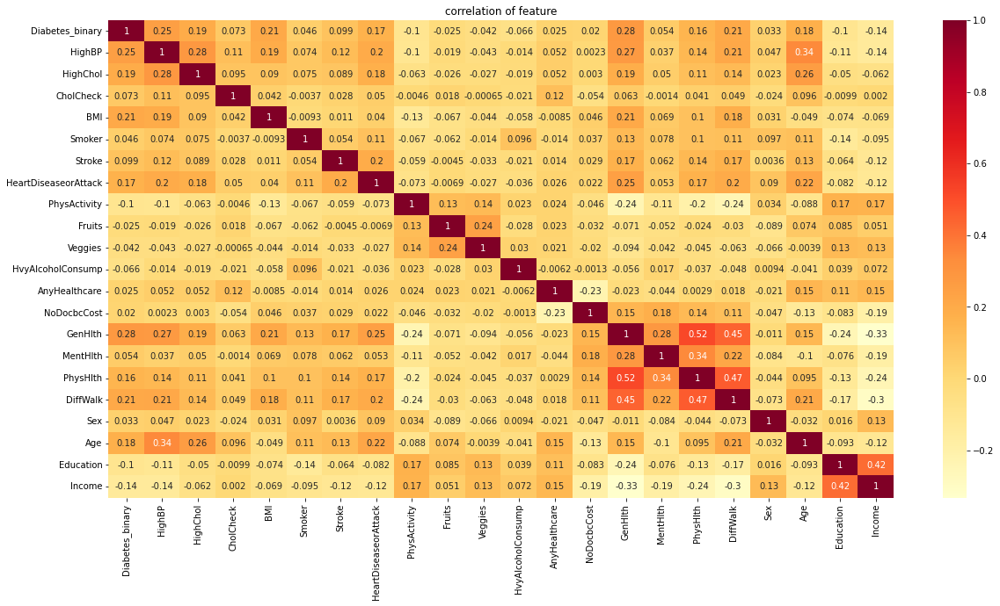

In [ ]:
#using heatmap to understand correlation better in dataset data 
#Heatmap of correlation

plt.figure(figsize = (20,10))
sns.heatmap(data.corr(),annot=True , cmap ='YlOrRd' )
plt.title("correlation of feature")

Correlation heatmap show relation between columns:

(GenHlth ,PhysHlth ),(PhysHlth , DiffWalk),(GenHlth ,DiffWalk )are highly correleted with each other => positive relation

(GenHlth ,Income ) , (DiffWalk , Income) are highly correleted with each other => Nagative relation

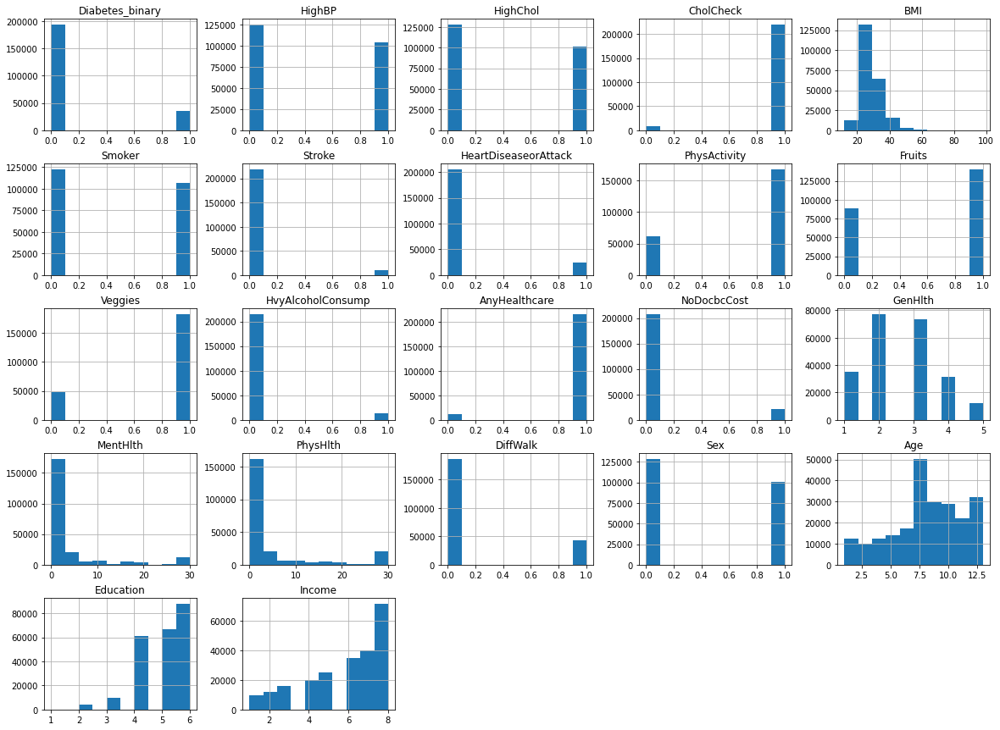

In [30]:
#using histogram to understand dataset data better

data.hist(figsize=(20,15));

Visualization of [Yes- No] columns and their relation with the target daietes


In [31]:
cols = ['HighBP', 'HighChol', 'CholCheck','Smoker',
       'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk']

In [32]:
def create_plot_pivot(data2, x_column):
    """ Create a pivot table for satisfaction versus another rating for easy plotting. """
    _df_plot = data2.groupby([x_column, 'Diabetes_binary']).size() \
    .reset_index().pivot(columns='Diabetes_binary', index=x_column, values=0)
    return _df_plot

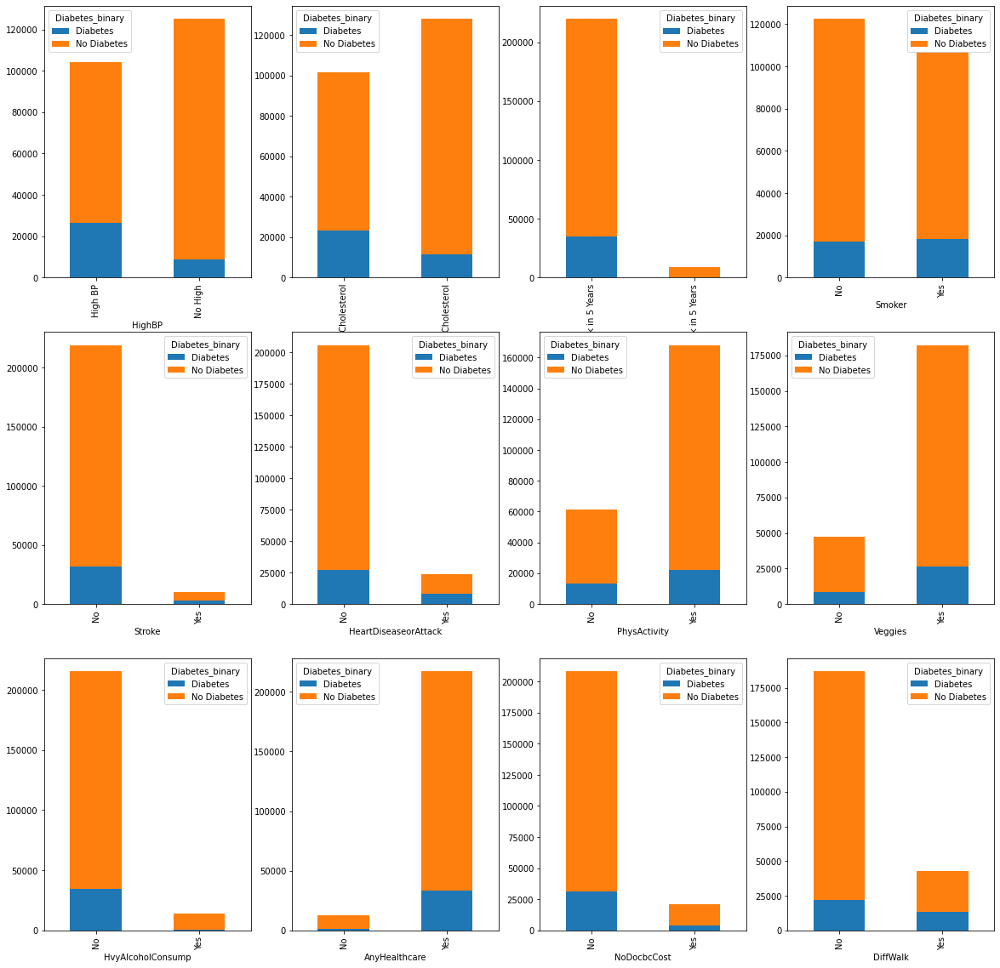

In [33]:
fig, ax = plt.subplots(3, 4, figsize=(20,20))
axe = ax.ravel()

c = len(cols)

for i in range(c):
    create_plot_pivot(data2, cols[i]).plot(kind='bar',stacked=True, ax=axe[i])
    axe[i].set_xlabel(cols[i])
    
fig.show()

View target values --" Diabetes_2"

In [ ]:
#average of column Daibetes_binary 
# 0 for non-Diabetic person and 1 for Diabetic person
data2["Diabetes_binary"].value_counts()

No Diabetes    194377
Diabetes        35097
Name: Diabetes_binary, dtype: int64

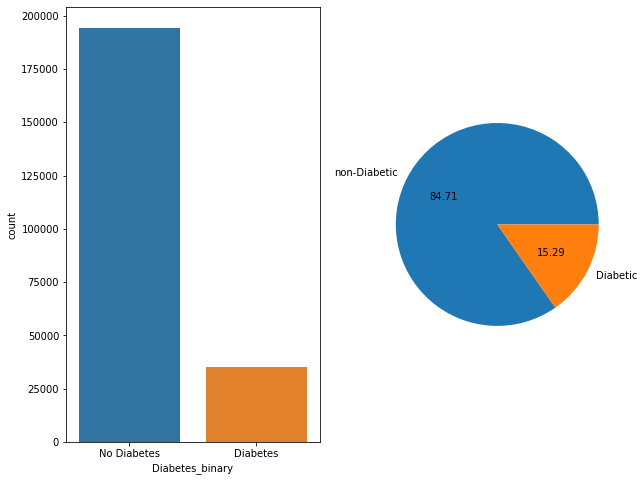

In [ ]:
#checking the value count of Diabetes_binary_str by using countplot
figure1, plot1 = plt.subplots(1,2,figsize=(10,8))

sns.countplot(data2['Diabetes_binary'],ax=plot1[0])

#checking diabetic and non diabetic pepoles average by pie 

labels=["non-Diabetic","Diabetic"]

plt.pie(data2["Diabetes_binary"].value_counts() , labels =labels ,autopct='%.02f' );

The Featture "Age" and its relation with target

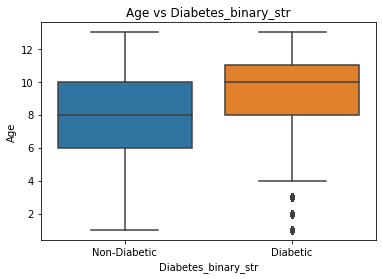

In [36]:
sns.boxplot(x = 'Diabetes_binary_str', y = 'Age', data = data)
plt.title('Age vs Diabetes_binary_str')
plt.show()

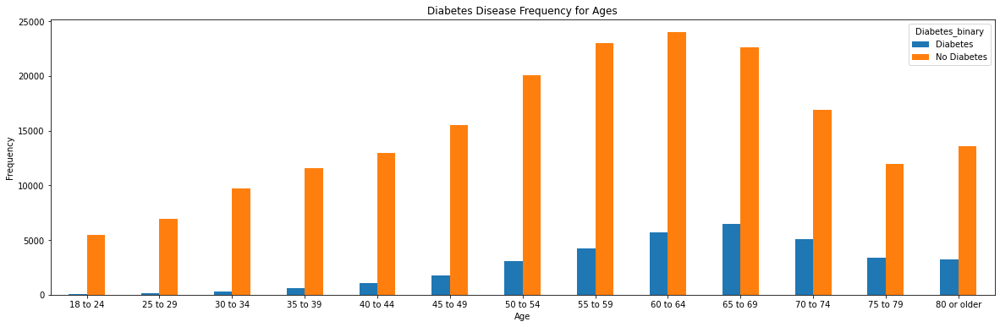

In [37]:
pd.crosstab(data2.Age,data2.Diabetes_binary).plot(kind="bar",figsize=(20,6))
plt.title('Diabetes Disease Frequency for Ages')
plt.xlabel('Age')
plt.xticks(rotation=0)
plt.ylabel('Frequency')
plt.show()

We know that as the age increases, the chances of diabetes also commonly increases. From above we can say, the median of the age of diabetic people is greater than that of non-diabetic people.

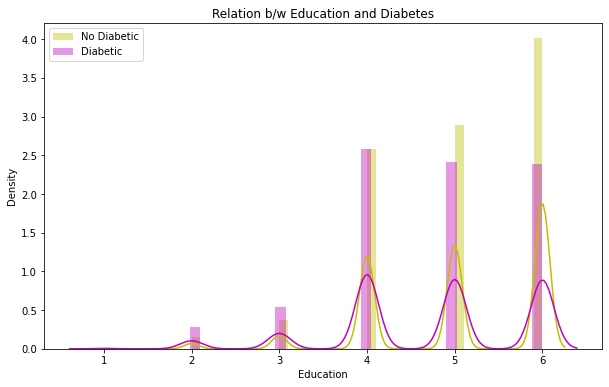

In [48]:
# The feature "Education" and its relation with the target
plt.figure(figsize=(10,6))


sns.distplot(data.Education[data.Diabetes_binary == 0], color="y", label="No Diabetic" )
sns.distplot(data.Education[data.Diabetes_binary == 1], color="m", label="Diabetic" )
plt.title("Relation b/w Education and Diabetes")

plt.legend()

We can see that most of people have high education and in the high level of education , the healthy people is more than others

Text(0.5, 1.0, 'Relation b/w Income and Diabetes')

<Figure size 1440x720 with 0 Axes>

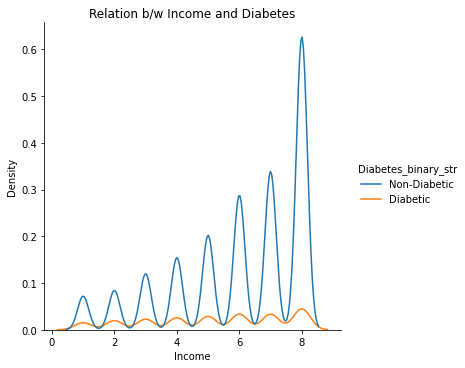

In [39]:
# The feature "Income" and its relation with the target
plt.figure(figsize=(20,10))

sns.displot(data=data, x="Income", hue="Diabetes_binary_str", kind="kde")
plt.title("Relation b/w Income and Diabetes")

We can see that most of people have high income and in the high level of income , the healthy people is more than others

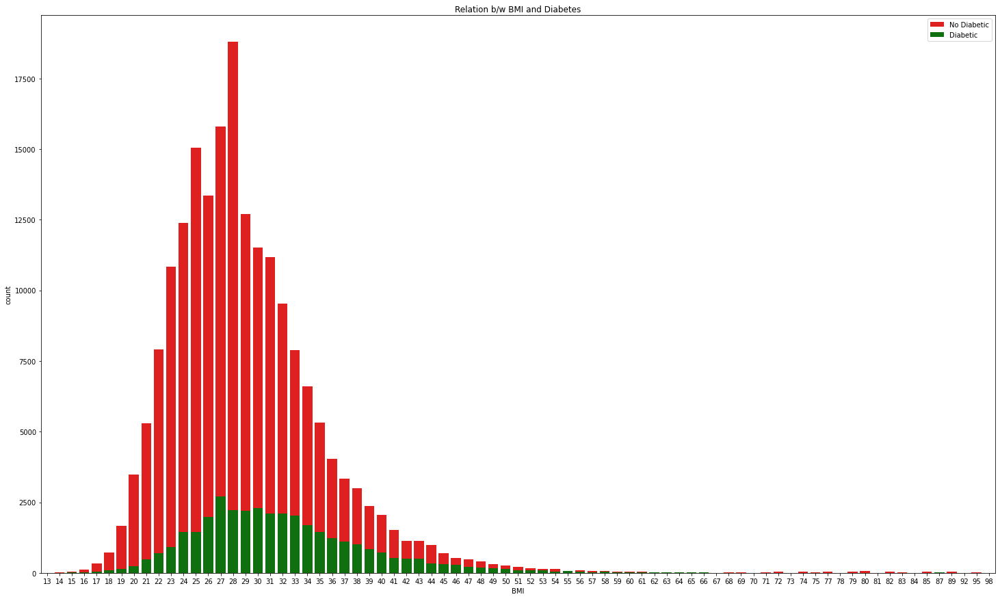

In [40]:
#  The feature "BMI" and its relation with target
#count plot to see numbers of Diabetic and non Diabetic patient of Group two BMI 

plt.figure(figsize=(25, 15))

sns.countplot(data.BMI[data.Diabetes_binary == 0], color="r", label="No Diabetic")
sns.countplot(data.BMI[data.Diabetes_binary == 1], color="g", label="Diabetic")
plt.title("Relation b/w BMI and Diabetes")

plt.legend()

As we can see people range between 24-33 BMI have more likely to have Diabetic.

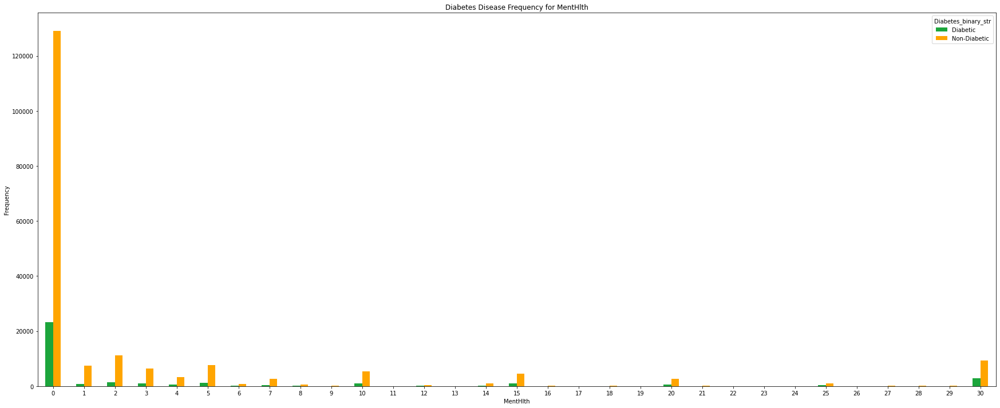

In [41]:
#  The feature "MenHlth" and its relation with target
pd.crosstab(data.MentHlth,data.Diabetes_binary_str).plot(kind="bar",figsize=(30,12),color=['#1CA53B', '#FFA500' ])
plt.title('Diabetes Disease Frequency for MentHlth')
plt.xlabel('MentHlth')
plt.xticks(rotation=0)
plt.ylabel('Frequency')
plt.show()

From figure we can say that Menthlth Group 0-5 have impact on Diabeti

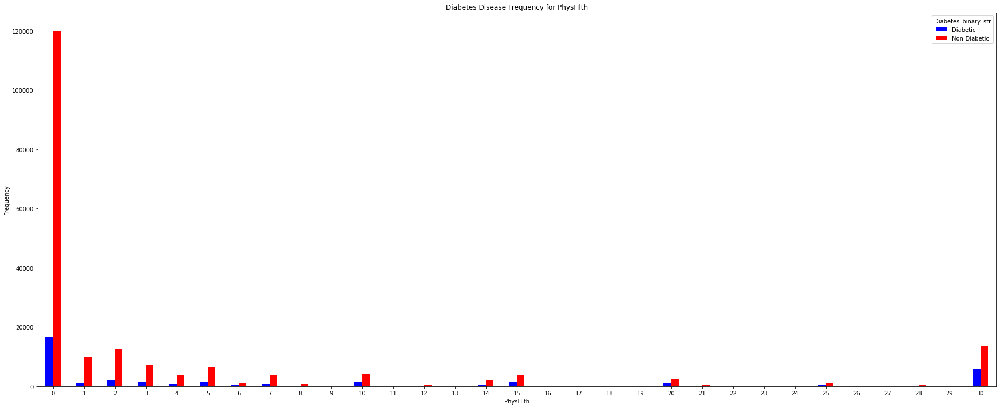

In [42]:
#  The feature "PhysHlth" and its relation with target
pd.crosstab(data.PhysHlth,data.Diabetes_binary_str).plot(kind="bar",figsize=(30,12),color=['Blue', 'Red' ])
plt.title('Diabetes Disease Frequency for PhysHlth')
plt.xlabel('PhysHlth')
plt.xticks(rotation=0)
plt.ylabel('Frequency')
plt.show()

From figure we can say that PhysHlth Group 0-5 have impact on Diabetic

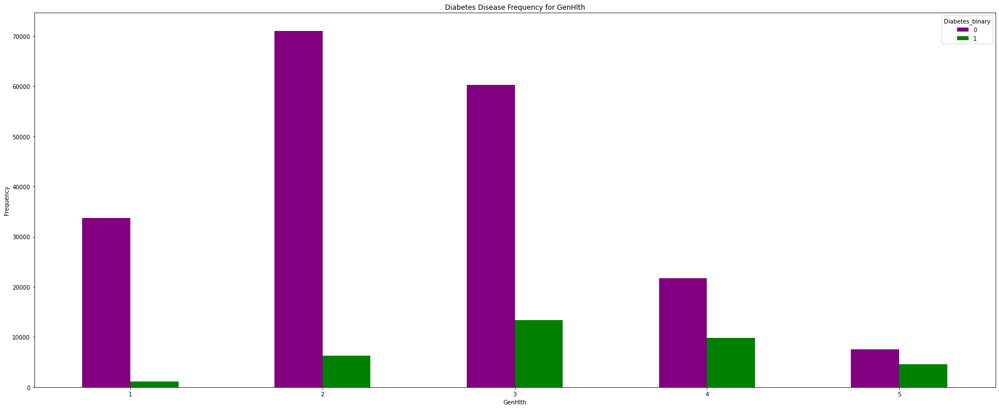

In [43]:
#  The feature "GenHlth" and its relation with target
pd.crosstab(data.GenHlth,data.Diabetes_binary).plot(kind="bar",figsize=(30,12),color=['Purple', 'Green' ])
plt.title('Diabetes Disease Frequency for GenHlth')
plt.xlabel('GenHlth')
plt.xticks(rotation=0)
plt.ylabel('Frequency')
plt.show()

not many peolpe have "5" and "4" of GenHlth ,but they have diabetes !!!

In [49]:
from imblearn.under_sampling import NearMiss
from sklearn.preprocessing import LabelEncoder
# Encode the target column
label_encoder = LabelEncoder()
data['Diabetes_binary'] = label_encoder.fit_transform(data['Diabetes_binary'])

# Split data into features and target
X = data.drop("Diabetes_binary", axis=1)
Y = data["Diabetes_binary"]

# One-hot encode categorical features if needed
X = pd.get_dummies(X, drop_first=True)

# Perform train-test split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.3, random_state=42)


print("Resampled training set size:", X_train.shape, Y_train.shape)
print("Resampled test set size:", X_test.shape, Y_test.shape)

Resampled training set size: (160631, 22) (160631,)
Resampled test set size: (68843, 22) (68843,)


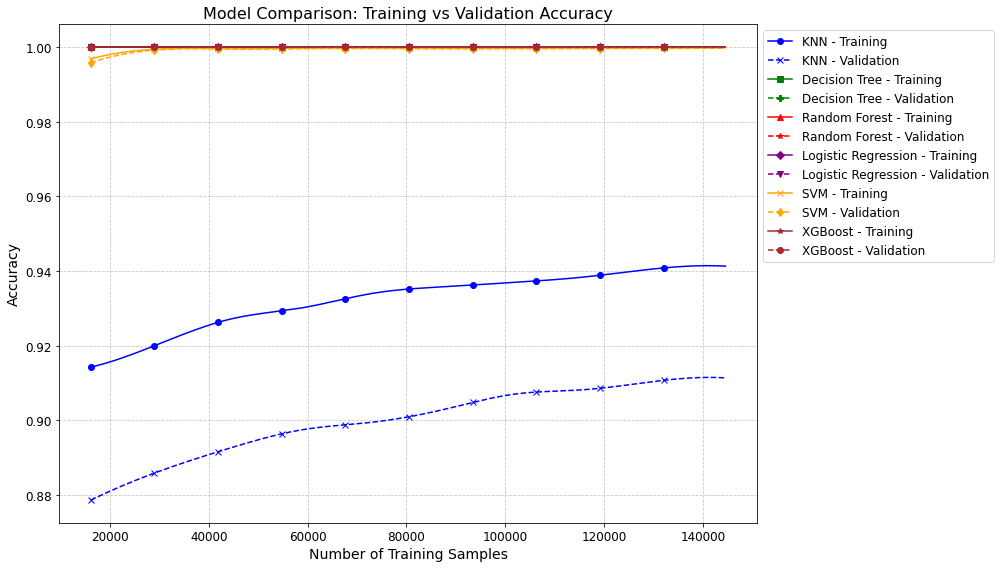

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from scipy.interpolate import make_interp_spline

# Define train sizes as percentages of the training dataset
train_sizes = np.linspace(0.1, 0.9, 10)

# Models to evaluate
models = {
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(max_depth=12, random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=10, max_depth=12, random_state=42),
    'Logistic Regression': LogisticRegression(max_iter=1500, random_state=42),
    'SVM': SVC(kernel='rbf', C=1.0, random_state=42),
    'XGBoost': XGBClassifier(eval_metric='error', learning_rate=0.1, random_state=42)
}

# Initialize dictionaries to store accuracies
train_accuracies = {name: [] for name in models}
test_accuracies = {name: [] for name in models}

# Train models for each train size
for train_size in train_sizes:
    x_train_subset, _, y_train_subset, _ = train_test_split(X_train, Y_train, train_size=train_size, random_state=42)

    for name, model in models.items():
        model.fit(x_train_subset, y_train_subset)

        train_pred = model.predict(x_train_subset)
        test_pred = model.predict(X_test)

        train_acc = accuracy_score(y_train_subset, train_pred)
        test_acc = accuracy_score(Y_test, test_pred)

        train_accuracies[name].append(train_acc)
        test_accuracies[name].append(test_acc)

# Plot training and validation accuracies for each model
plt.figure(figsize=(14, 8))

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']
markers_train = ['o', 's', '^', 'D', 'x', '*']
markers_test = ['x', 'P', '*', 'v', 'd', 'o']

for i, (name, color) in enumerate(zip(models, colors)):
    x_smooth = np.linspace(train_sizes.min() * len(X_train), train_sizes.max() * len(X_train), 300)
    train_smooth = make_interp_spline(train_sizes * len(X_train), train_accuracies[name])(x_smooth)
    test_smooth = make_interp_spline(train_sizes * len(X_train), test_accuracies[name])(x_smooth)

    plt.plot(x_smooth, train_smooth, label=f'{name} - Training', color=color, marker=markers_train[i], markevery=30)
    plt.plot(x_smooth, test_smooth, label=f'{name} - Validation', linestyle='--', color=color, marker=markers_test[i], markevery=30)

plt.title('Model Comparison: Training vs Validation Accuracy', fontsize=16)
plt.xlabel('Number of Training Samples', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=12)
plt.tight_layout()
plt.show()


# Feature Selections

**With Correlation**

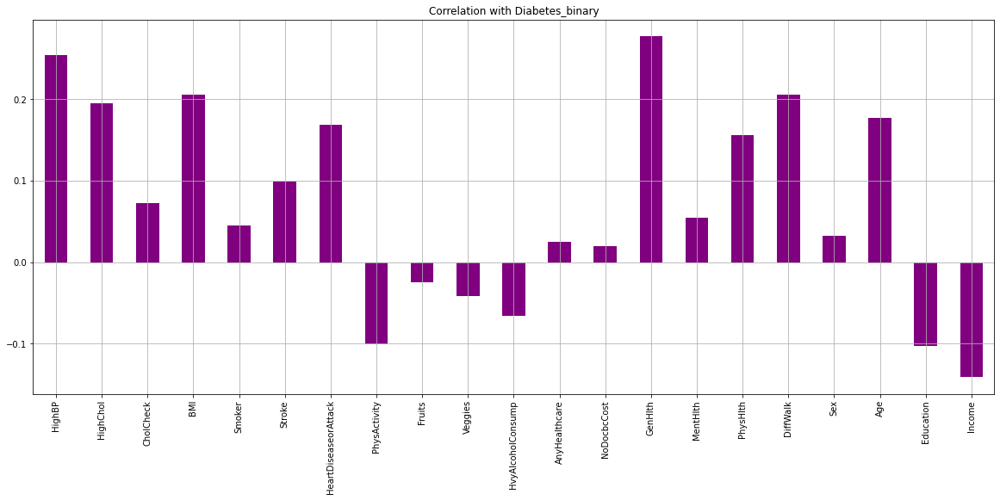

In [51]:
data.drop('Diabetes_binary', axis=1).corrwith(data.Diabetes_binary).plot(kind='bar', grid=True, figsize=(20, 8)
, title="Correlation with Diabetes_binary",color="Purple");

Diabetes_binary's relation with other columns Through bar Graph Result:

Fruits , AnyHealthcare , NoDocbccost and sex are least correlated with Diabetes_binary.

HighBP , HighChol , BMI , smoker , stroke , HeartDiseaseorAttack , PhysActivity , Veggies , MentHlth , HvyAlcoholconsump , GenHlth , PhysHlth , Age , Education , Income and DiffWalk have a significant correlation with Diabetes_binary.

**VIF Test**

A variance inflation factor (VIF) is a measure of the amount of multicollinearity in regression analysis. Multicollinearity exists when there is a correlation between multiple independent variables in a multiple regression model

In [52]:
def calc_VIF(x):
    vif= pd.DataFrame()
    vif['variables']=x.columns
    vif["VIF"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]

    return(vif)


X = add_constant(Orginal_data)  
ds=pd.Series([variance_inflation_factor(X.values, i) for i in range(X.shape[1])],index=X.columns)  
print(ds)

const                   128.848389
Diabetes_binary           1.448206
HighBP                    1.392152
HighChol                  1.196270
CholCheck                 1.036645
BMI                       1.221829
Smoker                    1.082185
Stroke                    1.094242
HeartDiseaseorAttack      1.195676
PhysActivity              1.167488
Fruits                    1.101370
Veggies                   1.103502
HvyAlcoholConsump         1.026415
AnyHealthcare             1.095647
NoDocbcCost               1.143394
GenHlth                   1.969881
MentHlth                  1.267448
PhysHlth                  1.701895
DiffWalk                  1.592094
Sex                       1.091814
Age                       1.365880
Education                 1.331998
Income                    1.547907
dtype: float64


**ANOVA Test**

Analysis of variance (ANOVA) is an analysis tool used in statistics that segregates an observed mean variability found inside a data set into two parts namely the systematic factors and random factors. The systematic factors have a statistical influence on the given data set, while the random factors do not

In [53]:
X = Orginal_data.iloc[:,1:]
Y = Orginal_data.iloc[:,0]

In [54]:
# ANOVA feature selection for numeric input and categorical output
# define feature selection
fs = SelectKBest(score_func=f_classif, k=10)
# apply feature selection
X_selected = fs.fit_transform(X, Y)
print(X_selected.shape)

(70692, 10)


In [55]:
pd.DataFrame(X_selected).head(3)

,0,1,2,3,4,5,6,7,8,9
0,1.0,0.0,26.0,0.0,3.0,30.0,0.0,4.0,6.0,8.0
1,1.0,1.0,26.0,0.0,3.0,0.0,0.0,12.0,6.0,8.0
2,0.0,0.0,26.0,0.0,1.0,10.0,0.0,13.0,6.0,8.0


**Chi Square**

the Chi-Square test is often used for feature selection. The goal of feature selection is to select a subset of features that are most relevant to the prediction task. The Chi-Square test can be used to determine if there is a significant association between each feature and the target variable.

In [56]:
#apply SelectKBest class to extract top 10 best features
BestFeatures = SelectKBest(score_func=chi2, k=10)
fit = BestFeatures.fit(X,Y)

df_scores = pd.DataFrame(fit.scores_)
df_columns = pd.DataFrame(X.columns)

#concatenating two dataframes for better visualization
f_Scores = pd.concat([df_columns,df_scores],axis=1)               # feature scores
f_Scores.columns = ['Feature','Score']

f_Scores

,Feature,Score
0,HighBP,4491.799960
1,HighChol,2804.501278
2,CholCheck,23.284293
3,BMI,10312.875795
4,Smoker,274.340616
5,Stroke,1042.976337
6,HeartDiseaseorAttack,2695.401378
7,PhysActivity,528.494034
8,Fruits,80.250850
9,Veggies,93.883501


In [57]:
print(f_Scores.nlargest(16,'Score'))

                 Feature         Score
15              PhysHlth  55929.053254
3                    BMI  10312.875795
14              MentHlth   9491.555258
18                   Age   5204.869946
13               GenHlth   5133.529630
0                 HighBP   4491.799960
16              DiffWalk   3926.865331
20                Income   2956.984221
1               HighChol   2804.501278
6   HeartDiseaseorAttack   2695.401378
5                 Stroke   1042.976337
10     HvyAlcoholConsump    608.852980
7           PhysActivity    528.494034
19             Education    442.144248
4                 Smoker    274.340616
12           NoDocbcCost    107.550083


We will use those features in our model

"Fruits" , "Veggies" , "Sex" , "CholCheck" , " AnyHealthcare" will not be with us

In [58]:
colomns = ["Fruits" , "Veggies" , "Sex" , "CholCheck" , "AnyHealthcare" , "Diabetes_binary_str"]

In [59]:
data.drop(colomns , axis= 1 ,inplace=True)

# Data Splitting

In [60]:
X=data.drop("Diabetes_binary",axis=1)
Y=data["Diabetes_binary"]

# Dealing with imbalancing

In [61]:
Y.value_counts()

0    194377
1     35097
Name: Diabetes_binary, dtype: int64

In [62]:
from imblearn.under_sampling import NearMiss
nm = NearMiss(version = 1 , n_neighbors = 10)

x_sm,y_sm= nm.fit_resample(X,Y)

In [63]:
y_sm.shape , x_sm.shape

((70194,), (70194, 16))

In [64]:
y_sm.value_counts()

1    35097
0    35097
Name: Diabetes_binary, dtype: int64

In [65]:
X_train , X_test , Y_train , Y_test = train_test_split(x_sm,y_sm, test_size=0.3 , random_state=42)

**Data Scalling**

In [66]:
from sklearn.preprocessing import StandardScaler
scalar = StandardScaler()
X_train = scalar.fit_transform(X_train)
X_test = scalar.fit_transform(X_test)

# Modeling

**Logistic**

In [67]:
lg = LogisticRegression(max_iter = 1500)
lg.fit(X_train , Y_train)

LogisticRegression(max_iter=1500)

In [68]:
# make predictions on test set
y_pred=lg.predict(X_test)

print('Training set score: {:.4f}'.format(lg.score(X_train, Y_train)))

print('Test set score: {:.4f}'.format(lg.score(X_test, Y_test)))

Training set score: 0.8512
Test set score: 0.8472


In [69]:
#check MSE & RMSE 
mse =mean_squared_error(Y_test, y_pred)
print('Mean Squared Error : '+ str(mse))
rmse = math.sqrt(mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error : '+ str(rmse))

Mean Squared Error : 0.152808775345458
Root Mean Squared Error : 0.3909076301960068


In [70]:
matrix = classification_report(Y_test,y_pred )
print(matrix)

              precision    recall  f1-score   support

           0       0.80      0.93      0.86     10468
           1       0.92      0.76      0.83     10591

    accuracy                           0.85     21059
   macro avg       0.86      0.85      0.85     21059
weighted avg       0.86      0.85      0.85     21059



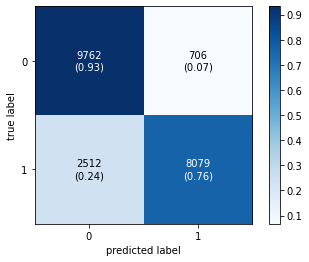

In [71]:
# calculating and plotting the confusion matrix
cm1 = confusion_matrix(Y_test,y_pred)
plot_confusion_matrix(conf_mat=cm1,show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

**Desicion Tree Model**

In [72]:
dt = DecisionTreeClassifier( max_depth= 12)
dt.fit(X_train , Y_train)

DecisionTreeClassifier(max_depth=12)

In [73]:
# make predictions on test set
y_pred=dt.predict(X_test)

print('Training set score: {:.4f}'.format(dt.score(X_train, Y_train)))

print('Test set score: {:.4f}'.format(dt.score(X_test, Y_test)))

Training set score: 0.8657
Test set score: 0.8474


In [74]:
#check MSE & RMSE 
mse =mean_squared_error(Y_test, y_pred)
print('Mean Squared Error : '+ str(mse))
rmse = math.sqrt(mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error : '+ str(rmse))

Mean Squared Error : 0.15261883280307706
Root Mean Squared Error : 0.3906646039802903


In [75]:
matrix = classification_report(Y_test,y_pred )
print(matrix)

              precision    recall  f1-score   support

           0       0.78      0.96      0.86     10468
           1       0.95      0.74      0.83     10591

    accuracy                           0.85     21059
   macro avg       0.86      0.85      0.85     21059
weighted avg       0.87      0.85      0.85     21059



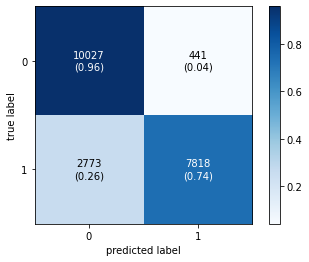

In [76]:
# calculating and plotting the confusion matrix
cm1 = confusion_matrix(Y_test,y_pred)
plot_confusion_matrix(conf_mat=cm1,show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

**KNN**

In [77]:
knn = KNeighborsClassifier(n_neighbors= 6 )
knn.fit(X_train , Y_train)

KNeighborsClassifier(n_neighbors=6)

In [78]:
# make predictions on test set
y_pred=knn.predict(X_test)

print('Training set score: {:.4f}'.format(knn.score(X_train, Y_train)))

print('Test set score: {:.4f}'.format(knn.score(X_test, Y_test)))

Training set score: 0.8419
Test set score: 0.8053


In [79]:
#check MSE & RMSE 
mse =mean_squared_error(Y_test, y_pred)
print('Mean Squared Error : '+ str(mse))
rmse = math.sqrt(mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error : '+ str(rmse))

Mean Squared Error : 0.19473859157604825
Root Mean Squared Error : 0.4412919572981681


In [80]:
matrix = classification_report(Y_test,y_pred )
print(matrix)

              precision    recall  f1-score   support

           0       0.73      0.95      0.83     10468
           1       0.93      0.66      0.77     10591

    accuracy                           0.81     21059
   macro avg       0.83      0.81      0.80     21059
weighted avg       0.83      0.81      0.80     21059



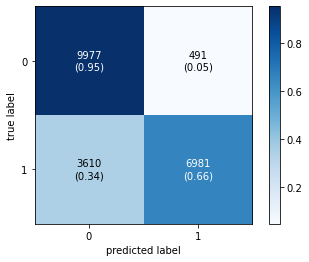

In [81]:
# calculating and plotting the confusion matrix
cm1 = confusion_matrix(Y_test,y_pred)
plot_confusion_matrix(conf_mat=cm1,show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

**Random Forest**

In [82]:
rf = RandomForestClassifier(max_depth=12 ,n_estimators =10, random_state=42 )

# fitting the model on the train data
rf.fit(X_train, Y_train)

RandomForestClassifier(max_depth=12, n_estimators=10, random_state=42)

In [83]:
# make predictions on test set
y_pred=rf.predict(X_test)

print('Training set score: {:.4f}'.format(rf.score(X_train, Y_train)))

print('Test set score: {:.4f}'.format(rf.score(X_test, Y_test)))

Training set score: 0.8713
Test set score: 0.8588


In [84]:
#check MSE & RMSE 
mse =mean_squared_error(Y_test, y_pred)
print('Mean Squared Error : '+ str(mse))
rmse = math.sqrt(mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error : '+ str(rmse))

Mean Squared Error : 0.14117479462462604
Root Mean Squared Error : 0.375732344395084


In [85]:
matrix = classification_report(Y_test,y_pred )
print(matrix)

              precision    recall  f1-score   support

           0       0.80      0.95      0.87     10468
           1       0.94      0.77      0.85     10591

    accuracy                           0.86     21059
   macro avg       0.87      0.86      0.86     21059
weighted avg       0.87      0.86      0.86     21059



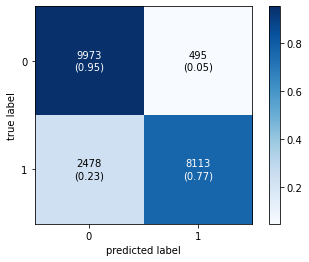

In [86]:
# calculating and plotting the confusion matrix
cm1 = confusion_matrix(Y_test,y_pred)
plot_confusion_matrix(conf_mat=cm1,show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

**SVM**

In [87]:
from sklearn.svm import SVC

# define the model
clf = SVC(kernel='rbf', C=1.0)

# train the model
clf.fit(X_train, Y_train)

y_pred=clf.predict(X_test)

print('Training set score: {:.4f}'.format(clf.score(X_train, Y_train)))

print('Test set score: {:.4f}'.format(clf.score(X_test, Y_test)))

Training set score: 0.8687
Test set score: 0.8603


In [88]:
#check MSE & RMSE 
mse =mean_squared_error(Y_test, y_pred)
print('Mean Squared Error : '+ str(mse))
rmse = math.sqrt(mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error : '+ str(rmse))

Mean Squared Error : 0.13970273992117385
Root Mean Squared Error : 0.37376829710553816


In [89]:
matrix = classification_report(Y_test,y_pred )
print(matrix)

              precision    recall  f1-score   support

           0       0.80      0.96      0.87     10468
           1       0.95      0.76      0.85     10591

    accuracy                           0.86     21059
   macro avg       0.88      0.86      0.86     21059
weighted avg       0.88      0.86      0.86     21059



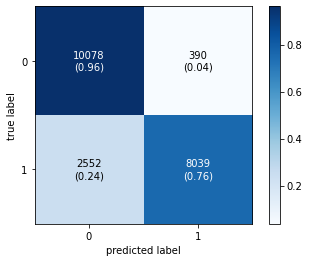

In [90]:
# calculating and plotting the confusion matrix
cm1 = confusion_matrix(Y_test,y_pred)
plot_confusion_matrix(conf_mat=cm1,show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

**XGBoost**

In [91]:
# pip install xgboost

In [92]:
from xgboost import XGBClassifier
xg = XGBClassifier(eval_metric= 'error', learning_rate= 0.1)
xg.fit(X_train , Y_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              eval_metric='error', gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.1, max_delta_step=0,
              max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=8,
              num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [93]:
y_pred=xg.predict(X_test)

print('Training set score: {:.4f}'.format(xg.score(X_train, Y_train)))

print('Test set score: {:.4f}'.format(xg.score(X_test, Y_test)))

Training set score: 0.8770
Test set score: 0.8663


In [94]:
#check MSE & RMSE 
mse =mean_squared_error(Y_test, y_pred)
print('Mean Squared Error : '+ str(mse))
rmse = math.sqrt(mean_squared_error(Y_test, y_pred))
print('Root Mean Squared Error : '+ str(rmse))

Mean Squared Error : 0.13367206420057934
Root Mean Squared Error : 0.3656119038004361


In [95]:
matrix = classification_report(Y_test,y_pred )
print(matrix)

              precision    recall  f1-score   support

           0       0.81      0.95      0.88     10468
           1       0.94      0.79      0.86     10591

    accuracy                           0.87     21059
   macro avg       0.88      0.87      0.87     21059
weighted avg       0.88      0.87      0.87     21059



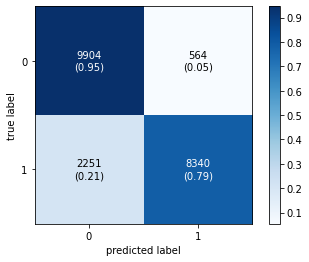

In [96]:
# calculating and plotting the confusion matrix
cm1 = confusion_matrix(Y_test,y_pred)
plot_confusion_matrix(conf_mat=cm1,show_absolute=True,
                                show_normed=True,
                                colorbar=True)
plt.show()

                 Feature    Chi2_Score
11              PhysHlth  97988.761672
2                    BMI  15507.736174
10              MentHlth  11419.584750
13                   Age   8539.906340
0                 HighBP   8098.548237
12              DiffWalk   7875.496177
9                GenHlth   7671.732832
5   HeartDiseaseorAttack   5822.145697
1               HighChol   4869.312739
15                Income   3377.099257
4                 Stroke   2156.678382
7      HvyAlcoholConsump    937.401148
6           PhysActivity    617.563886
14             Education    479.112939
3                 Smoker    253.826098
8            NoDocbcCost     83.662830


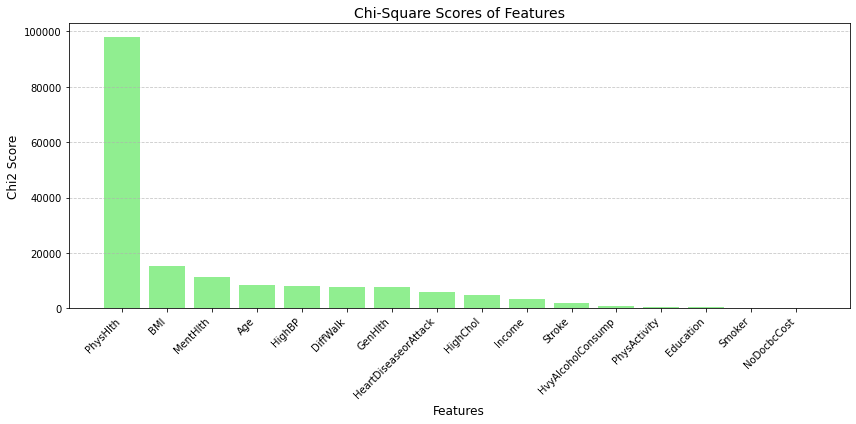

In [97]:
from sklearn.feature_selection import SelectKBest, chi2

# Assuming X and Y are already defined
chi2_selector = SelectKBest(chi2, k=10)  # Select top 10 features
X_chi2 = chi2_selector.fit_transform(X, Y)

# Get feature scores and names
chi2_scores = chi2_selector.scores_
feature_names = X.columns
chi2_df = pd.DataFrame({'Feature': feature_names, 'Chi2_Score': chi2_scores})
chi2_df = chi2_df.sort_values(by='Chi2_Score', ascending=False)

print(chi2_df)

# Visualize the chi-square scores
plt.figure(figsize=(12, 6))
plt.bar(chi2_df['Feature'], chi2_df['Chi2_Score'], color='lightgreen')
plt.xticks(rotation=45, ha='right')
plt.title("Chi-Square Scores of Features", fontsize=14)
plt.xlabel("Features", fontsize=12)
plt.ylabel("Chi2 Score", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


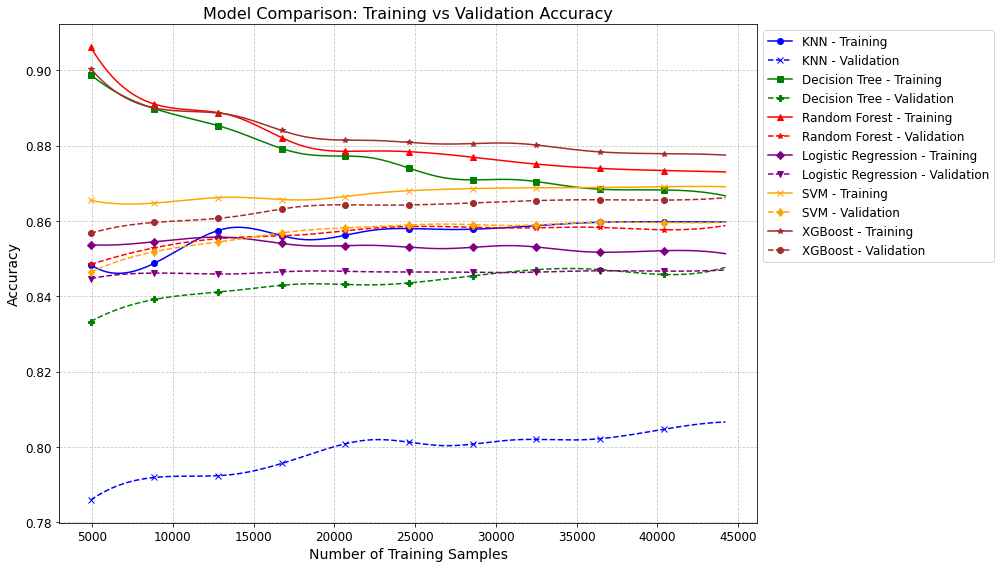

In [98]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from scipy.interpolate import make_interp_spline

# Define train sizes as percentages of the training dataset
train_sizes = np.linspace(0.1, 0.9, 10)

# Models to evaluate
models = {
    'KNN': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(max_depth=12, random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=10, max_depth=12, random_state=42),
    'Logistic Regression': LogisticRegression(max_iter=1500, random_state=42),
    'SVM': SVC(kernel='rbf', C=1.0, random_state=42),
    'XGBoost': XGBClassifier(eval_metric='error', learning_rate=0.1, random_state=42)
}

# Initialize dictionaries to store accuracies
train_accuracies = {name: [] for name in models}
test_accuracies = {name: [] for name in models}

# Train models for each train size
for train_size in train_sizes:
    x_train_subset, _, y_train_subset, _ = train_test_split(X_train, Y_train, train_size=train_size, random_state=42)

    for name, model in models.items():
        model.fit(x_train_subset, y_train_subset)

        train_pred = model.predict(x_train_subset)
        test_pred = model.predict(X_test)

        train_acc = accuracy_score(y_train_subset, train_pred)
        test_acc = accuracy_score(Y_test, test_pred)

        train_accuracies[name].append(train_acc)
        test_accuracies[name].append(test_acc)

# Plot training and validation accuracies for each model
plt.figure(figsize=(14, 8))

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']
markers_train = ['o', 's', '^', 'D', 'x', '*']
markers_test = ['x', 'P', '*', 'v', 'd', 'o']

for i, (name, color) in enumerate(zip(models, colors)):
    x_smooth = np.linspace(train_sizes.min() * len(X_train), train_sizes.max() * len(X_train), 300)
    train_smooth = make_interp_spline(train_sizes * len(X_train), train_accuracies[name])(x_smooth)
    test_smooth = make_interp_spline(train_sizes * len(X_train), test_accuracies[name])(x_smooth)

    plt.plot(x_smooth, train_smooth, label=f'{name} - Training', color=color, marker=markers_train[i], markevery=30)
    plt.plot(x_smooth, test_smooth, label=f'{name} - Validation', linestyle='--', color=color, marker=markers_test[i], markevery=30)

plt.title('Model Comparison: Training vs Validation Accuracy', fontsize=16)
plt.xlabel('Number of Training Samples', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=12)
plt.tight_layout()
plt.show()


In [9]:
from sklearn.model_selection import train_test_split

# Assuming 'data' is your loaded dataset and 'target' is the label column
# Replace 'data' and 'target' with the actual variable names from your dataset
X = data.drop(columns=['Diabetes_binary'])  # Features
y = data['Diabetes_binary']  # Labels

# Split the dataset into training and testing sets
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Now apply feature scaling and continue with the code
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)


In [100]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# Define the model
rf = RandomForestClassifier(random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [150, 200],  # Number of trees in the forest
    'max_depth': [ 10, None],  # Maximum depth of the tree
    'min_samples_split': [5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [4, 8],  # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt', 'log2'],  # Number of features to consider when looking for the best split
}

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)

# Fit the model
grid_search.fit(X_train, Y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Print the best parameters and score
print(f"Best Parameters: {best_params}")
print(f"Best Cross-validation Score: {grid_search.best_score_:.4f}")

# Evaluate on the test set
best_rf = grid_search.best_estimator_
test_score = best_rf.score(X_test, Y_test)
print(f"Test set score with best parameters: {test_score:.4f}")

Fitting 5 folds for each of 48 candidates, totalling 240 fits
Best Parameters: {'max_depth': None, 'max_features': 'auto', 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 150}
Best Cross-validation Score: 0.8647
Test set score with best parameters: 0.8611


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from scipy.interpolate import make_interp_spline

# Feature Scaling
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Feature Extraction using PCA
pca = PCA(n_components=10)  # Reduce to 10 components
x_train_pca = pca.fit_transform(x_train_scaled)
x_test_pca = pca.transform(x_test_scaled)

# Hyperparameter Tuning for Models
model_params = {
    'KNN': {
        'model': KNeighborsClassifier(),
        'params': {'n_neighbors': [3, 5, 7], 'weights': ['uniform', 'distance']}
    },
    'Decision Tree': {
        'model': DecisionTreeClassifier(random_state=42),
        'params': {'max_depth': [5, 10, 15], 'min_samples_split': [2, 5, 10]}
    },
    'Random Forest': {
        'model': RandomForestClassifier(random_state=42),
        'params': {'n_estimators': [50, 100, 150], 'max_depth': [10, 15, 20]}
    },
    'Logistic Regression': {
        'model': LogisticRegression(max_iter=1000, random_state=42),
        'params': {'C': [0.01, 0.1, 1, 10], 'solver': ['liblinear', 'lbfgs']}
    },
    'SVM': {
        'model': SVC(probability=True, random_state=42),
        'params': {'C': [0.1, 1, 10], 'kernel': ['linear', 'rbf']}
    },
    'XGBoost': {
        'model': XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42),
        'params': {'n_estimators': [100, 150], 'learning_rate': [0.01, 0.1, 0.2]}
    }
}

train_sizes = np.linspace(0.1, 0.9, 10)
train_accuracies = {name: [] for name in model_params}
test_accuracies = {name: [] for name in model_params}

# Perform GridSearchCV for each model
best_models = {}
for name, config in model_params.items():
    grid_search = GridSearchCV(config['model'], config['params'], cv=5, scoring='accuracy')
    grid_search.fit(x_train_pca, y_train)
    best_models[name] = grid_search.best_estimator_

    print(f"Best Parameters for {name}: {grid_search.best_params_}")

# Evaluate Models with Best Parameters
for train_size in train_sizes:
    x_train_subset, _, y_train_subset, _ = train_test_split(x_train_pca, y_train, train_size=train_size, random_state=42)
    
    for name, model in best_models.items():
        model.fit(x_train_subset, y_train_subset)

        train_pred = model.predict(x_train_subset)
        test_pred = model.predict(x_test_pca)

        train_acc = accuracy_score(y_train_subset, train_pred)
        test_acc = accuracy_score(y_test, test_pred)

        train_accuracies[name].append(train_acc)
        test_accuracies[name].append(test_acc)

# Plot Results
plt.figure(figsize=(14, 10))
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']
markers_train = ['o', 's', '^', 'D', 'x', '*']
markers_test = ['x', 'P', '*', 'v', '+', 'h']

for i, (name, color) in enumerate(zip(model_params.keys(), colors)):
    x_smooth = np.linspace(train_sizes.min() * len(x_train_pca), train_sizes.max() * len(x_train_pca), 300)
    train_smooth = make_interp_spline(train_sizes * len(x_train_pca), train_accuracies[name])(x_smooth)
    test_smooth = make_interp_spline(train_sizes * len(x_train_pca), test_accuracies[name])(x_smooth)

    plt.plot(x_smooth, train_smooth, label=f'{name} - Training', color=color, marker=markers_train[i], markevery=30)
    plt.plot(x_smooth, test_smooth, label=f'{name} - Validation', linestyle='--', color=color, marker=markers_test[i], markevery=30)

plt.title('Effect of Training Set Size on Overfitting After Feature Extraction and Optimization', fontsize=16)
plt.xlabel('Number of Training Samples', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(loc='upper left', bbox_to_anchor=(1, 1), fontsize=12)
plt.tight_layout()

plt.show()


Best Parameters for KNN: {'n_neighbors': 7, 'weights': 'uniform'}
Best Parameters for Decision Tree: {'max_depth': 5, 'min_samples_split': 2}
Best Parameters for Random Forest: {'max_depth': 10, 'n_estimators': 100}
Best Parameters for Logistic Regression: {'C': 0.01, 'solver': 'liblinear'}
